In [4]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import ensemble, svm, model_selection, neighbors, linear_model, gaussian_process, neural_network, naive_bayes, tree
from read_msc import *
import time
import pickle

import matplotlib.pyplot as plt
from skimage import io, filters, morphology, restoration, feature, transform
from sklearn import ensemble, svm, model_selection, neighbors, linear_model, gaussian_process, neural_network 
import numpy as np
from read_msc import *
from scipy import ndimage, stats
from ipywidgets import widgets, interact
import subprocess
import os
import sys
from collections import namedtuple
import time

import scipy
# Needed for kdTree on large point sets:
import sys

#for gaussian fit to image histogram
from scipy.stats import norm
import matplotlib.mlab as mlab


/anaconda2/lib/python2.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


Colors for Plotting

In [5]:
light_red = '#fbb4ae'
red = '#e41a1c'

light_blue = '#b3cde3'
blue = '#377eb8'

light_green = '#ccebc5'
green = '#4daf4a'

light_purple = '#decbe4'
purple = '#984ea3'

light_orange = '#fed9a6'
orange = '#ff7f00'

light_palette = [light_red, light_blue, light_green, light_purple, light_orange]
bold_palette = [red, blue, green, purple, orange]

Load Image and Filters

In [6]:
fname_base = 'max_diadem_smoothed'
fname = 'max_diadem.png'
compiled_data = np.load(fname_base + '_input.npy')

with open(fname_base + '_dimensions.txt', 'r') as f:
    dimensions = [line.strip() for line in f]
    
#base image
image = io.imread(fname, as_gray=True, flatten=True)

Gaussian Blur for Morse Smale Complex

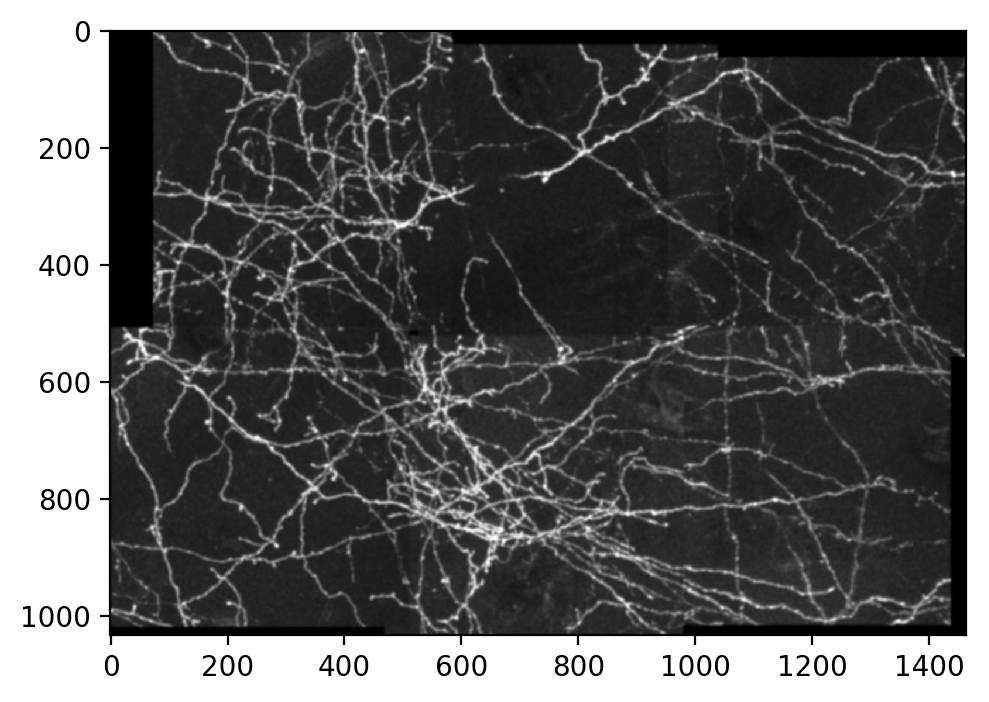

In [7]:
blurred_image = filters.gaussian(image, sigma=2**1)
plt.figure(num=None, dpi=200)
plt.imshow(blurred_image, cmap=plt.cm.Greys_r)
fname_raw = fname.rsplit('.', 1)[0] + '_smoothed.raw'
#blurred_image.astype('float32').tofile(fname_raw)
image = blurred_image

Smooth image with gaussian blur
input: image array to be smoothed
output: file path to image

In [8]:
def gauss_smooth_img(image, fname):
    blurred_image = filters.gaussian(image, sigma=2**1)
    plt.figure(num=None, dpi=200)
    #plt.imshow(blurred_image, cmap=plt.cm.Greys_r)
    fname_raw = fname.rsplit('.', 1)[0] + '_smoothed.raw'
    blurred_image.astype('float32').tofile(fname_raw)
    image = blurred_image
    return (blurred_image , fname_raw)

Display image

In [9]:
def show_image(image):
    plt.figure(num=None, dpi=200)
    plt.imshow(image, cmap=plt.cm.Greys_r)

Pixel Distribution

(1033, 1464)
(0.0, 0.9205598633046345)
('inflection point = ', 0.2472317035406827, ',', 0.3869343297876942)
('peak = ', 0.1473826654270908, ',', 0.3946328822652391)


"\nn_, bins_ = np.histogram(image.flatten())\nmids = 0.5*(bins_[1:] + bins_[:-1])\nmu_ = np.average(mids, weights=n_)\nvar = np.average((mids - mu_)**2, weights=n_)\nsigma_ = np.sqrt(var)\nprint('mu', mu_, 'var',var,'sigma',sigma_)\n"

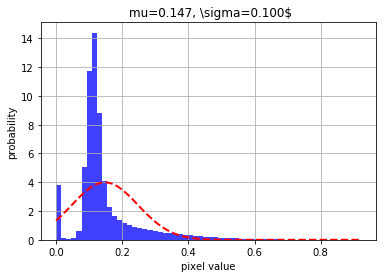

In [10]:
print(image.shape)
print(np.min(image.flatten()), np.max(image.flatten()))

# To generate input file for MSCVisus:
# image.astype('float32').tofile('lightning_smoothed.raw')

#_ = plt.hist(image.flatten(), 25)


(mu, sigma) = norm.fit(image.flatten())
n, bins, patches = plt.hist(image.flatten(), 60, normed=1, facecolor='blue', alpha=0.75)

# add a 'best fit' line
y = mlab.normpdf( bins, mu, sigma)
l = plt.plot(bins, y, 'r--', linewidth=2)

# inflection points at x = mean +/- standard deviation
inflection_2 = mu + sigma
x=mu+sigma
plt.scatter(x, y=norm.pdf(x),s=3, marker=',', alpha=0)
#plot
plt.xlabel('pixel value')
plt.ylabel('probability')
plt.title(r' mu=%.3f, \sigma=%.3f$' %(mu, sigma))
plt.grid(True)

# Peak value probability density function at mean
gauss_peak = norm.pdf(mu)
print('inflection point = ', mu+sigma , ',', norm.pdf(mu+sigma))
print('peak = ', mu , ',', norm.pdf(mu))

""" sanity check """
"""
n_, bins_ = np.histogram(image.flatten())
mids = 0.5*(bins_[1:] + bins_[:-1])
mu_ = np.average(mids, weights=n_)
var = np.average((mids - mu_)**2, weights=n_)
sigma_ = np.sqrt(var)
print('mu', mu_, 'var',var,'sigma',sigma_)
"""

#### Compute histogram of pixel values within image, fit gaussian to historgram and return mean, standard deviation and variance.
#### Input: image, boolean to plot (optional)
#### output: mean, standard deviation, variance

In [11]:
def gaussian_fit(image, plot = False):
    n, bins_ = np.histogram(image.flatten())
    mids = 0.5*(bins_[1:] + bins_[:-1])
    mu = np.average(mids, weights=n)
    var = np.average((mids - mu)**2, weights=n)
    sigma = np.sqrt(var)
    right_inflection = mu+sigma
    return mu, sigma, var#, right_inflection)


To Do: Load Various Filters for Set of Morse Smale Functions

Compute Morse Smale

In [130]:

persistence_coarse = 8.5
persistence_fine = 0.5
proc = subprocess.Popen([os.path.join('..','..','MSCvisus','MSCTest2DViewer','test_2d_viewer'),
                                fname_raw,
                                str(image.shape[1]),
                                str(image.shape[0]),
                                "1",
                                "1",
                                str(persistence_coarse)],
                               stdin=subprocess.PIPE,
                               stdout=subprocess.PIPE,
                               stderr=subprocess.PIPE)
stdout, stderr = proc.communicate()
print(stdout.decode("utf-8"))
print(stderr.decode("utf-8"))
test_msc_coarse = MSC()
test_msc_coarse.read_from_file(fname_raw)

0=../../MSCvisus/MSCTest2DViewer/test_2d_viewer
1=max_diadem_smoothed.raw
2=1464
3=1033
4=1
5=1
6=8.5
stest=1512312
Computing discrete gradient: 
Gothere
neighbor=2928
maxval = 0.717353, looky = 0.060975, num = 26366
pos is 24494
writing nodes
writing arcs




#### Computation of Morse Smale Complex
#### input: image array, raw file path (gaussian smoothed)
#### output: msc

In [12]:
def Compute_MSC(image, fname_raw, persistence = 8.5):
    proc = subprocess.Popen([os.path.join('..','..','MSCvisus','MSCTest2DViewer','test_2d_viewer'),
                                    fname_raw,
                                    str(image.shape[1]),
                                    str(image.shape[0]),
                                    "1",
                                    "1",
                                    str(persistence)],
                                   stdin=subprocess.PIPE,
                                   stdout=subprocess.PIPE,
                                   stderr=subprocess.PIPE)
    stdout, stderr = proc.communicate()
    #print(stdout.decode("utf-8"))
    #print(stderr.decode("utf-8"))
    msc = MSC()
    msc.read_from_file(fname_raw)
    return msc

##### Iterate Arcs and Critical Points Collect only arcs which contain pixel values greater then mean of gaussian fit to histrogram of blurred image

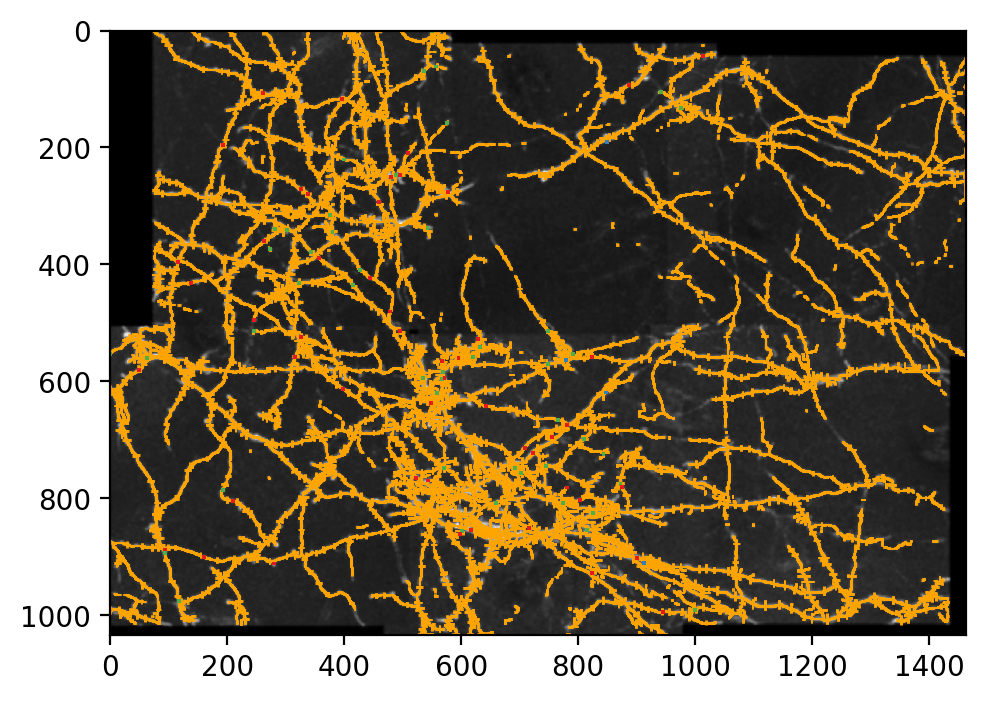

In [60]:
# Arc Points
# store arcs containing pixel values above mean of gaussian fit to image histogram
arc_mask_image = np.zeros(image.shape)
filtered_arcs = []
for a in test_msc_coarse.arcs:
    points = np.array(a.line)
    for point in points:
        if image[int(point[1]) , int(point[0])] > mu:
            filtered_arcs.append(tuple((point[1], point[0])))
            
# take critical points when iterating 

show_image(image)
plt.scatter(np.array(filtered_arcs)[:,1], np.array(filtered_arcs)[:,0], facecolor='orange', edgecolor='none', s=1, marker=',', alpha=0.5)

# critical points [minima, saddle, maxima]

colors = [blue, green, red]
filtered_min = []
filtered_max = []
filtered_saddle = []
for node in test_msc_coarse.nodes.values():
    x, y = node.xy
    if node.xy in filtered_arcs:
        if node.index == 0:
            filtered_min.append(node.xy)
        if node.index ==1:
            filtered_saddle.append(node.xy)
        if node.index == 2:
            filtered_max.append(node.xy)
            
plt.scatter(np.array(filtered_min)[:,1], np.array(filtered_min)[:,0], facecolor=colors[0], edgecolor='none', marker=',', s=2)
plt.scatter(np.array(filtered_saddle)[:,1], np.array(filtered_saddle)[:,0], facecolor=colors[1], edgecolor='none', marker=',', s=2)
plt.scatter(np.array(filtered_max)[:,1], np.array(filtered_max)[:,0], facecolor=colors[2], edgecolor='none', marker=',', s=2)

plt.gca().set_xlim(0, image.shape[1])
_ = plt.gca().set_ylim(image.shape[0], 0)


In [132]:
dir(test_msc_coarse.arcs[0])
print(test_msc_coarse.arcs[0].nodes)

print(test_msc_coarse.arcs[0].node_ids)

[<read_msc.MSCNode instance at 0x1da5715c68>, <read_msc.MSCNode instance at 0x1da5715cb0>]
[0, 151]


#### Given the morse smale complex for some threshold iso-value / persistence filter arc boundaries based on the mean of the gaussian fit to the histogram of pixel values throughout the image

#### ? what could be a better heuristic: mean, inflection point, number of pixels within arc...

In [13]:
def MSC_filtration(image, msc, mu):# Arc Points
    # store arcs containing pixel values above mean of gaussian fit to image histogram
    arc_mask_image = np.zeros(image.shape)
    filtered_arcs = []
    for a in msc.arcs:
        points = np.array(a.line)
        arc_points = []
        for point in points:
            if image[int(point[1]) , int(point[0])] > mu:
                arc_points.append(tuple((point[1], point[0])))
        if len(arc_points):
            filtered_arcs.append(arc_points)
            
    # make id dictionary for each arc
            
    # critical points [minima, saddle, maxima]
    colors = [blue, green, red]
    filtered_min = []
    filtered_max = []
    filtered_saddle = []
    for node in msc.nodes.values():
        x, y = node.xy
        if node.xy in filtered_arcs:
            if node.index == 0:
                filtered_min.append(node.xy)
            if node.index ==1:
                filtered_saddle.append(node.xy)
            if node.index == 2:
                filtered_max.append(node.xy)
                
    filtered_msc = [filtered_arcs, filtered_min, filtered_saddle, filtered_max]
    #return filtered msc as [arcs, minima, saddle, maxima]
    return filtered_msc


In [14]:
def plot_filtered_msc(image, filtered_msc):
    
    filtered_arcs = filtered_msc[0]
    filtered_min = filtered_msc[1]
    filtered_saddle = filtered_msc[2]
    filtered_max = filtered_msc[3]

    show_image(image)
    
    plt.scatter(np.array(filtered_arcs)[:,1], np.array(filtered_arcs)[:,0], facecolor='orange', edgecolor='none', s=1, marker=',', alpha=0.5)
    plt.scatter(np.array(filtered_min)[:,1], np.array(filtered_min)[:,0], facecolor=colors[0], edgecolor='none', marker=',', s=2)
    plt.scatter(np.array(filtered_saddle)[:,1], np.array(filtered_saddle)[:,0], facecolor=colors[1], edgecolor='none', marker=',', s=2)
    plt.scatter(np.array(filtered_max)[:,1], np.array(filtered_max)[:,0], facecolor=colors[2], edgecolor='none', marker=',', s=2)

    plt.gca().set_xlim(0, image.shape[1])
    _ = plt.gca().set_ylim(image.shape[0], 0)

#### Create Closed Balls Around Arc MSC Critical Points and Arcs

In [62]:
arc_mask_image = np.zeros(image.shape)
for a in test_msc_coarse.arcs:
    points = np.array(a.line)
    for point in points:
        arc_mask_image[int(point[1]), int(point[0])] = 1
        
fat_mask_image = morphology.dilation(arc_mask_image, selem=morphology.disk(10))
arc_mask_image = np.ma.masked_where(arc_mask_image == 0, arc_mask_image)
#show_image(fat_mask_image)

#### Select Pixels in Negative Space After Fattening of Arcs

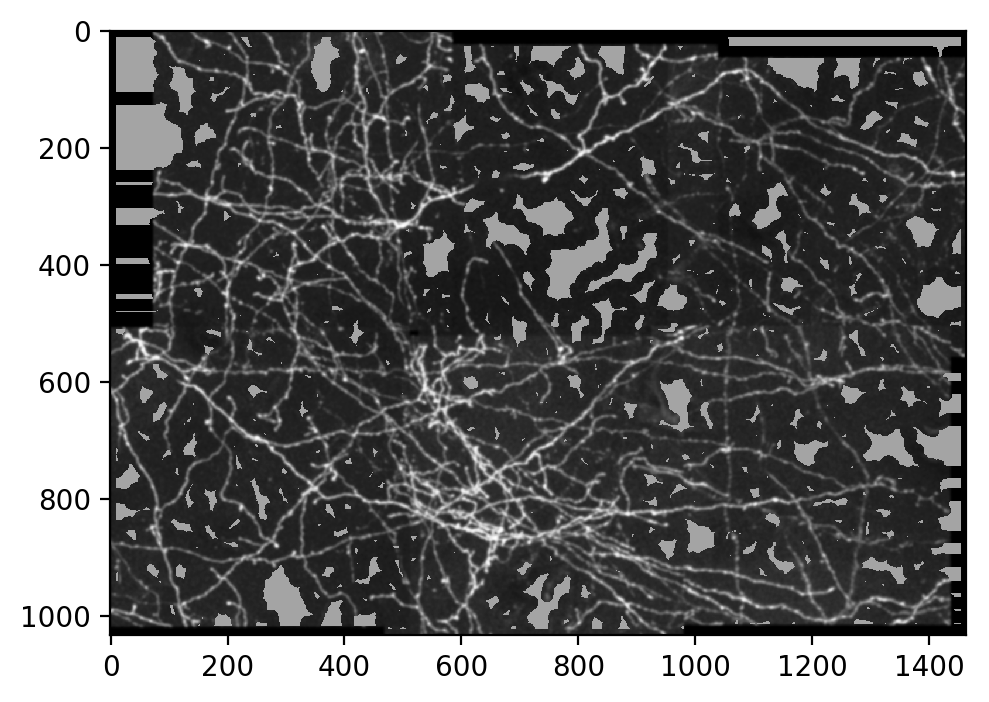

In [69]:
background = zip(*np.where(fat_mask_image == 0))
example_bg_select = np.copy(image)
for x,y in background:
    example_bg_select[x,y] = 0.5
show_image(example_bg_select)

#### create black image size of input image setting pixels of filtered morse smale complex arc to white. Place a closed ball cover over pixels along arc. Select pixels outside of closed cover as negative background pixels
#### Input: original image, filtered morse smale complex, boolean to plot (optional)
#### Output: pixel locations along arc (positive samples), pixel location in background (negative samples)

In [66]:
def Collect_Training_from_Filtered(image, filtered_msc, plot=False):
    #Collect Positive Samples

    arc_mask_image = np.zeros(image.shape)
    for arc in filtered_msc[0]:
        for point in arc:
            arc_mask_image[int(point[0]), int(point[1])] = 1
        
    fat_mask_image = morphology.dilation(np.copy(arc_mask_image), selem=morphology.disk(10))
    arc_mask_image = np.ma.masked_where(arc_mask_image == 0, arc_mask_image)
    
    if plot:
        show_image(fat_mask_image)
    
    #Collect Negative Samples
    background = np.array(zip(*np.where(fat_mask_image == 0)))

    from sklearn.cluster import KMeans
    ncluster = 16
    k_means = KMeans(init='k-means++', n_clusters=ncluster, n_init=10)
    k_means.fit(background)
    
    background_groups = []
    for k in range(ncluster):
        sub_group = []
        group_k_indx = zip(*np.where(k_means.labels_ == k))
        for loc_k in group_k_indx:
            sub_group.append(background[loc_k])
        background_groups.append(sub_group) 
    
    if plot:
        example_bg_select = np.copy(image)
        for x,y in zip(*np.where(fat_mask_image == 0)):
            example_bg_select[x,y] = .3
        
        show_image(example_bg_select)
        
    
    return filtered_msc[0], background_groups


Collect Filtered Images

In [16]:
fname_base = 'max_diadem_smoothed'
filtered_images = np.load(fname_base + '_input.npy')

with open(fname_base + '_dimensions.txt', 'r') as f:
    dimensions = [line.strip() for line in f]

Example computation gaussian smoothing call on filtered img

original_max_diadem_smoothed_smoothed.raw


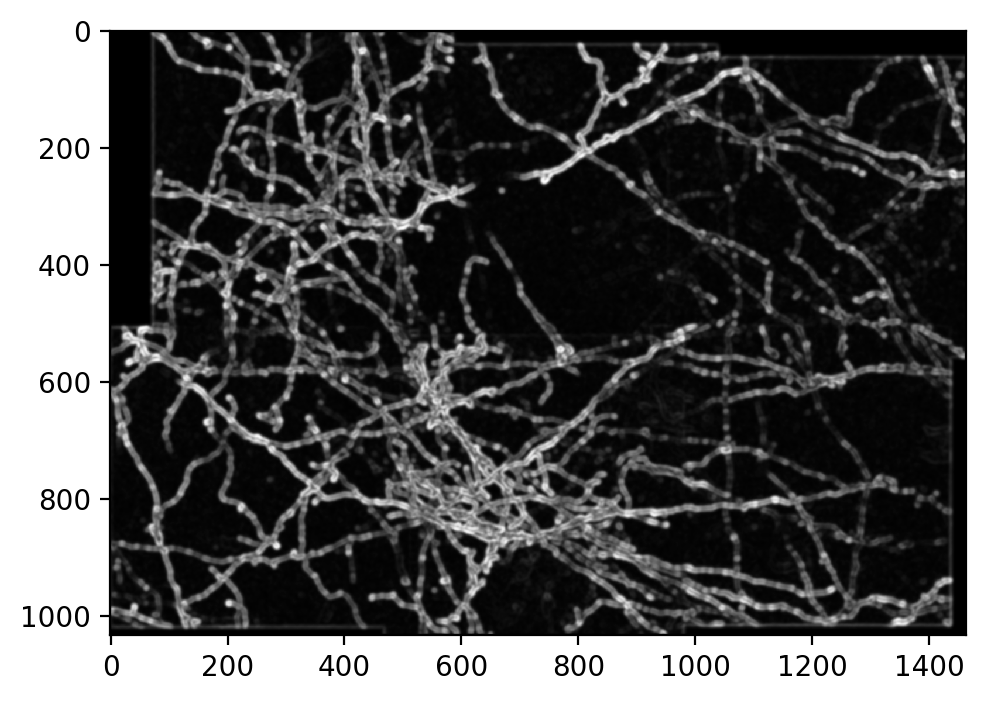

In [160]:
ex_filtered_smoothed, ex_fname = gauss_smooth_img(filtered_images[:,:,1],dimensions[0]+'_max_diadem_smoothed')

show_image(ex_filtered_smoothed)
print(ex_fname)

#### Example morse smale computation on blured image and morse smale complex filtration based on mean gaussian fit histogram over blurred image

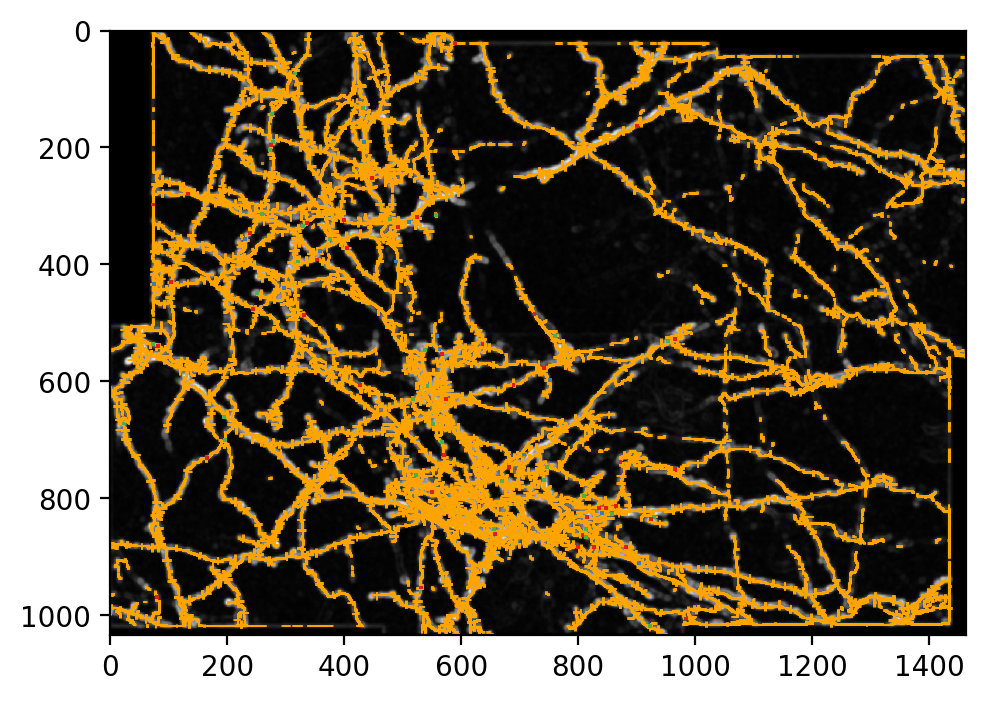

In [175]:
ex_full_msc = Compute_MSC(ex_filtered_smoothed, ex_fname)
#filter msc, return as [arcs, minima, saddle, maxima]
mu, sigma, var = gaussian_fit(ex_filtered_smoothed)
ex_filtered_msc = MSC_filtration(ex_filtered_smoothed, ex_full_msc, mu)
plot_filtered_msc(ex_filtered_smoothed, ex_filtered_msc)
# run with   jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000  NOTEBOOKNAME.ipynb   to control IOPub rate

# Obtain Training samples, positives along filtered arc, negatives in negative space after closed
# ball cover along points of arcs

#
# Be more conservative with threshold


In [203]:
pos_samples, neg_samples = Collect_Training_from_Filtered(ex_filtered_smoothed, ex_filtered_msc)


#### Could do set intersection of pixels obtained from MSC of computed over multiple filtrations
#### Example: preserve arcs consistent (set intersection) in original image and arcs in MSC of Sabel filtered image

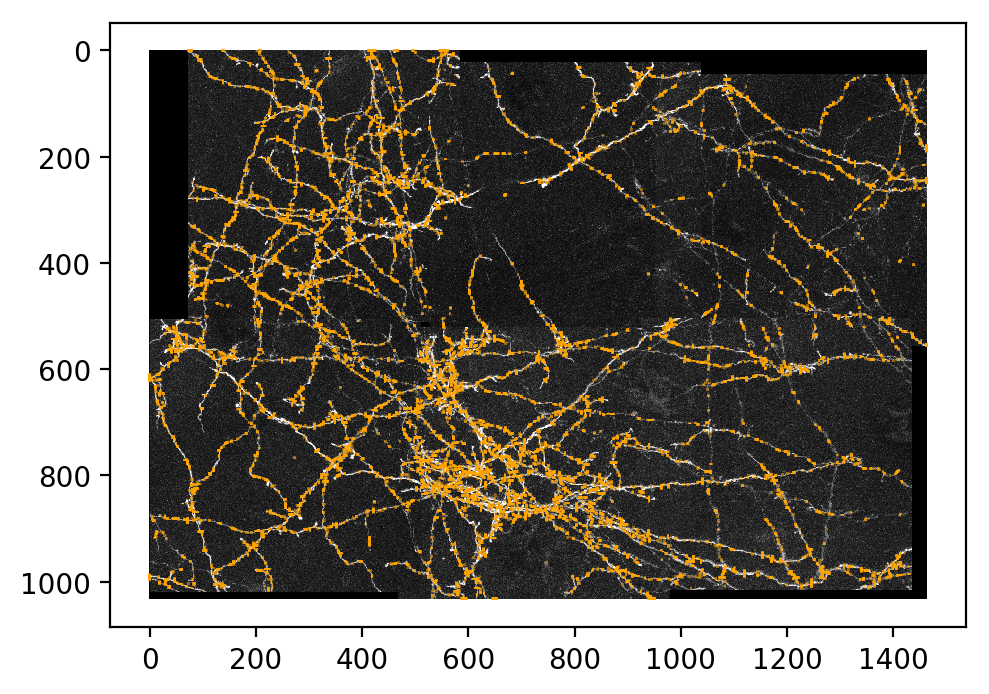

In [193]:
shared_arcs = list(set(filtered_arcs).intersection(set(pos_samples)))
show_image(image)
plt.scatter(np.array(shared_arcs)[:,1], np.array(shared_arcs)[:,0], facecolor='orange', edgecolor='none', s=1, marker=',', alpha=0.5)
    

#### Compute gaussian smoothing of all filtered images. Compute the morse smale complex over each image after kernel has been applied. Filter the msc based on the mean value obtained from fitting a gaussian to the respective image's histogram over pixel values. Collect pixel values  located on obtained msc arcs for each image. Collect pixel values located in regions reasonably far from msc arcs. return training samples as positives along arcs and negatives from background
#### Input: number of kernels to consider
#### Output: positive pixel values along arcs for kernel_size filters, negative pixel values along arcs for kernel_size filters,



In [134]:
def Filtered_MSC_Training_Set(kernel_size, persistence = 8.5):#, image_set = filtered_images):
    pos_pixels = []
    neg_pixels = []
    gauss_msc_pos = []
    gauss_msc_neg = []
    for i in range (kernel_size):
        #Gaussian blur original and all filtered images
        filtered_smoothed, fname = gauss_smooth_img(filtered_images[:,:,i],dimensions[i]+'_max_diadem_smoothed')

        #Compute the morse smale complex of all blurred images and filter arcs of interest based
        # on mu from gaussian fit to pixel histogram for each image
        full_msc = Compute_MSC(filtered_smoothed, fname, persistence)
        mu, sigma, var = gaussian_fit(filtered_smoothed)
        filtered_msc = MSC_filtration(filtered_smoothed, full_msc, mu)

        #Cover filtered MSC with closed balls to select negative space as background and arcs
        # as positive samples
        pos_samples, neg_samples = Collect_Training_from_Filtered(filtered_smoothed, filtered_msc, plot=True)
        
        a = np.array(neg_samples)
        print(a.shape)
        #get pixel values under arc for positives
        for arc_pos in pos_samples:
            for point_pos in arc_pos:
                pos_pixels.append( [filtered_images[int(point_pos[0]),int(point_pos[1]),i]] )
                
                
        #get negative pixel values
        for bg_group in neg_samples:
            for point_neg in bg_group:
                neg_pixels.append( [filtered_images[int(point_neg[0]),int(point_neg[1]),i]] )
                
        #fit gaussian to negative pixel values in background and take mean, 
        #deviation, variation
        for arc_neg in neg_samples:
            filtered_negatives = []
            for point_neg in arc_neg:
                filtered_negatives.append( [filtered_images[int(point_neg[0]),int(point_neg[1]),i]] )
            #fit gaussian to negative sample pixels in background
            mu_neg, sigma_neg, var_neg = gaussian_fit(np.array(filtered_negatives))
            gauss_msc_neg.append([mu_neg, sigma_neg, var_neg])

        #fit gaussian to positive pixel values under arcs of MSC and take mean, deviation, 
        # and variation
        for arc in pos_samples:
            filtered_positives = []
            for point in arc:
                filtered_positives.append( [filtered_images[int(point[0]),int(point[1]),i]] )
            #fit gaussian to positive pixel values under arc and take mean, deviation, variation
            # NOTE! can filter based on arc length, currently doing three bc three degrees of freedom
            #       in gaussian fit.
            if len(filtered_positives) >= 3:
                mu_pos, sigma_pos, var_pos = gaussian_fit(np.array(filtered_positives))
                gauss_msc_pos.append([mu_pos, sigma_pos, var_pos])

        

    train_x = np.vstack((pos_pixels, neg_pixels))
    train_y = np.hstack((np.ones(np.array(pos_pixels).shape[0]), np.zeros(np.array(neg_pixels).shape[0])))
    
    gaussian_msc_arc_X = np.vstack((gauss_msc_pos, gauss_msc_neg))
    gaussian_msc_arc_Y = np.hstack((np.ones(np.array(gauss_msc_pos).shape[0]),np.zeros(np.array(gauss_msc_neg).shape[0])))
    
    return train_x, train_y, gaussian_msc_arc_X, gaussian_msc_arc_Y
    


#train_x, train_y, g_pos, g_neg = Filtered_MSC_Training_Set(4)

### Classify each pixel of original image based on trained classifier

In [250]:
def show_classifier_result(original_img, classifier):
    flattened_data = original_img.flatten()#.reshape(-1, compiled_data.shape[-1])
    prediction_per_pixel = []
    for px in flattened_data:
        prediction_per_pixel.append(classifier.predict(px))
    predicted_segmentation = np.array(prediction_per_pixel).reshape(original_img.shape)
    show_image(predicted_segmentation)
    

### logistic regression returns classifier

In [80]:
def logistic_Regression(train_x, train_y):
    logit = linear_model.LogisticRegression(penalty='l2',
                                            dual=False,
                                            tol=0.0001,
                                            C=1.0,
                                            fit_intercept=True,
                                            intercept_scaling=1,
                                            class_weight=None,
                                            random_state=None,
                                            solver='liblinear',
                                            max_iter=100,
                                            verbose=0,
                                            warm_start=False,
                                            n_jobs=1)
    #print(train_x)
    logit.fit(train_x, train_y)
    logit.score(train_x, train_y)
    print(train_x.shape)
    print(train_y.shape)
    print(filtered_images[:,:,0].shape)
    
    param_grid = {'penalty': ['l1', 'l2'],
                  'C': [1.0, 10],}

    best_logit = model_selection.GridSearchCV(logit, param_grid)
    best_logit.fit(train_x, train_y)
    print(best_logit.best_params_, best_logit.best_score_)
    #show_classifier_result(filtered_images[:,:,0], best_logit)
    return best_logit

### Classification based on feature vectors of Morse Smale Complex: Compute MSC, use classifier trained on filtered MSC (arcs filtered by threshold=mean of gaussian fit to histogram of pixel values for entire image) then trained on feature vector of mean, standard deviation and variance for pixels within each arc as positive training samples and gaussian fit to nearest neighbors of size 16 for pixels in background (background taken to be remaining negative space outside of closed cover with balls or radius 10 over each point in arc)

In [126]:
def classify_msc(unknown_image, classifier, persistence = 8.5, show_pruned = False):
    #Gaussian blur original and all filtered images
    filtered_smoothed, fname = gauss_smooth_img(unknown_image,'unknown_img_max_diadem_smoothed')
    predicted_classification = np.copy(unknown_image)/1.3#np.zeros(unknown_image.shape)

    #Compute the morse smale complex of all blurred images and filter arcs of interest based
    # on mu from gaussian fit to pixel histogram for each image
    msc = Compute_MSC(filtered_smoothed, fname, persistence)
    arc_set_pixels = []
    gauss_arcs = []
    for arc in msc.arcs:
        arc_pixels = []
        gauss_arc = []
        points = np.array(arc.line)
        #arc_points.append(tuple((point[1], point[0])))
        for point in points:
            arc_pixels.append( unknown_image[int(point[1]),int(point[0])] )
        gauss_arc.append(gaussian_fit(np.array(arc_pixels)))  
        arc_set_pixels.append(arc_pixels)
        #predict given obsereved arc attributes
        arc_classification = classifier.predict(gauss_arc)
        
        for point in points:
            if show_pruned == False:
                predicted_classification[int(point[1]),int(point[0])] = arc_classification if arc_classification == 1 else predicted_classification[int(point[1]),int(point[0])]
            else:
                predicted_classification[int(point[1]),int(point[0])] = arc_classification if arc_classification == 1 else 0.13
    show_image(predicted_classification)

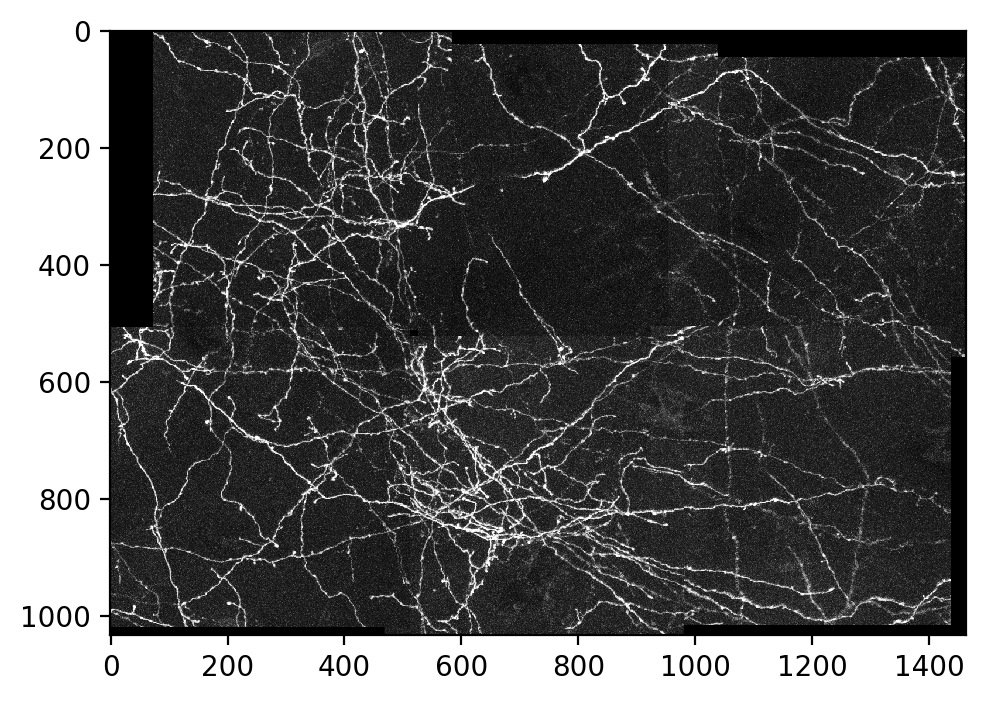

In [252]:
show_image(image)

#### no bueno

In [283]:
def k_nearest_neighbors(k, train_x, train_y):
    knn = neighbors.KNeighborsClassifier(n_neighbors=k,
                                         weights='uniform', 
                                         algorithm='auto', 
                                         leaf_size=30, 
                                         p=2, 
                                         metric='minkowski', 
                                         metric_params=None, 
                                         n_jobs=1)

    knn.fit(train_x, train_y)
    knn.score(train_x, train_y)
    show_classifier_result(compiled_data, knn)

#try epsilon graph
#sklearn.neighbors.RadiusNeighborsClassifier

### Running on original image only and use gaussian statistics of (positive) pixels under arcs and (negative) pixels in background.

(16,)


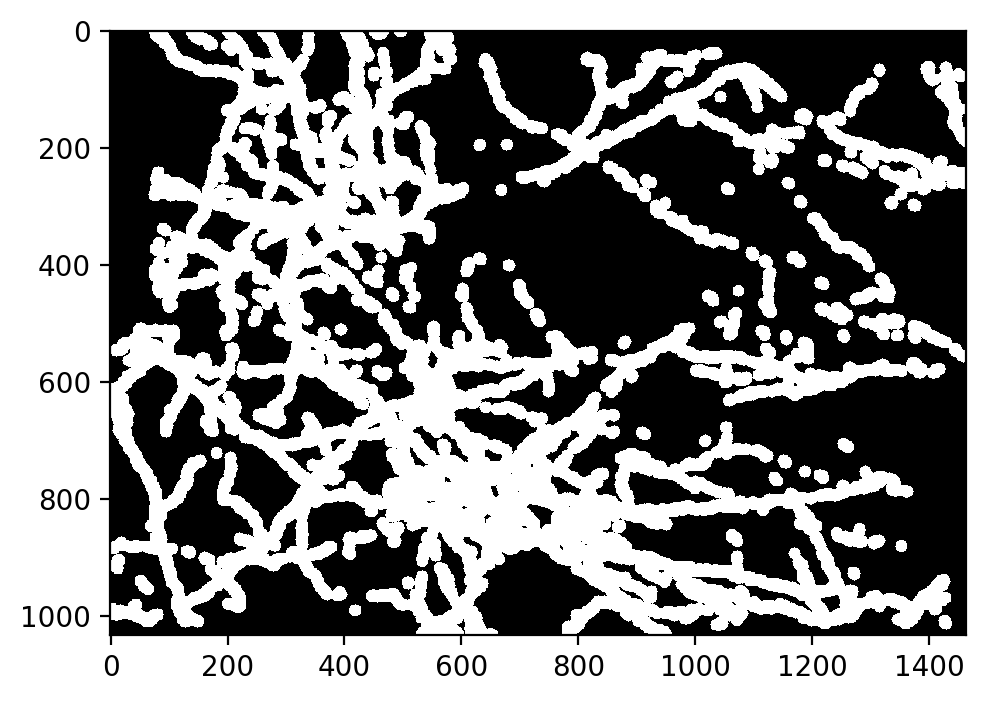

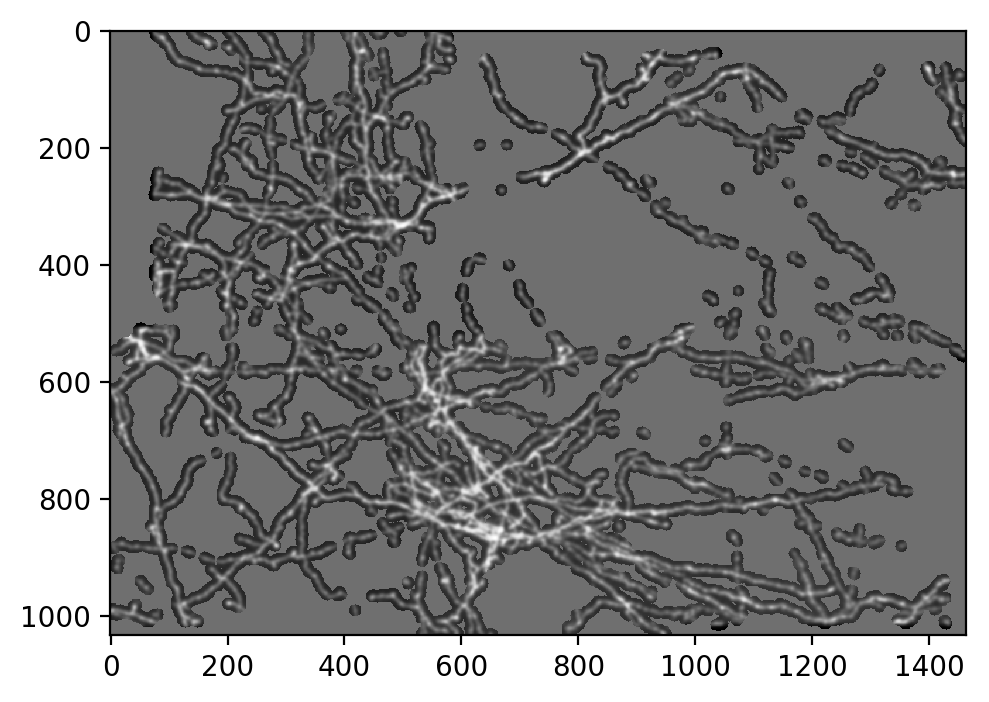

In [67]:
train_x, train_y, gaussian_msc_arc_X, gaussian_msc_arc_Y = Filtered_MSC_Training_Set(1)


### Try Logistic regression, after filtering morse smale complex by mean of gaussian fit to pixels, on positively labeled pixels under arcs and negatively labeled pixels in background.

(3789, 3)
(3789,)
(1033, 1464)
({'penalty': 'l1', 'C': 10}, 1.0)


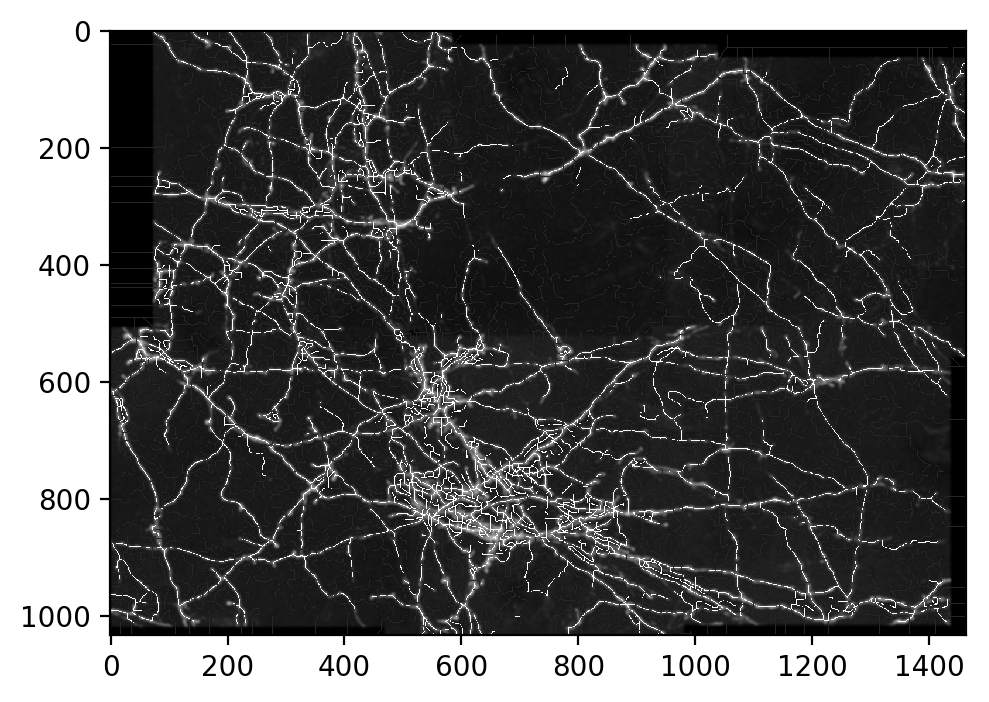

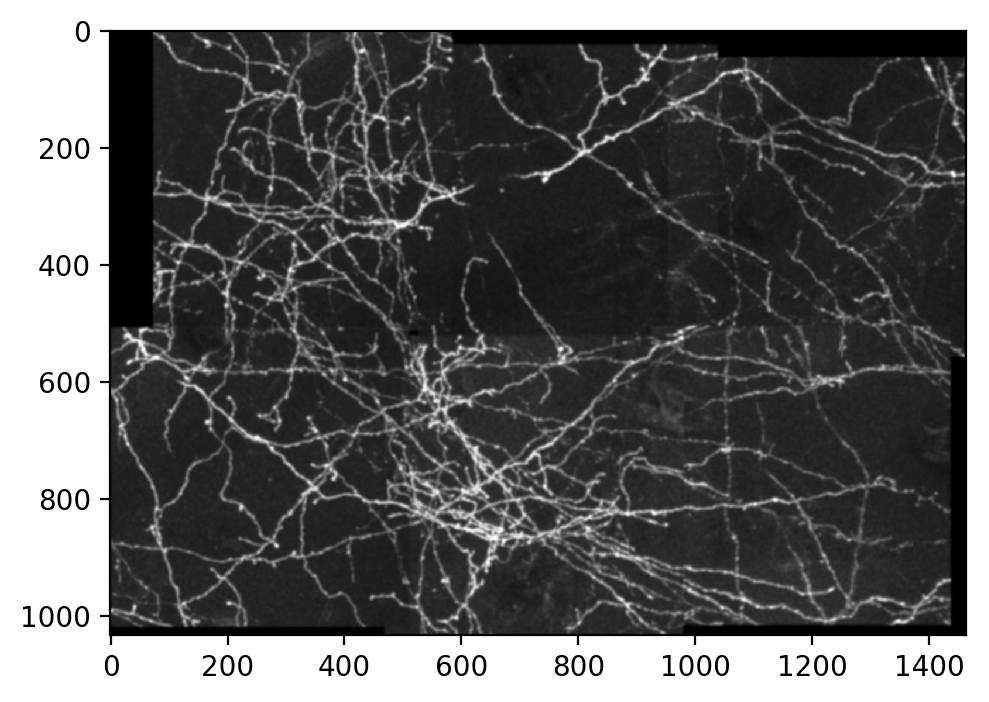

In [138]:
logistic_classifier = logistic_Regression(gaussian_msc_arc_X, gaussian_msc_arc_Y)
unknown_image = filtered_images[:,:,0]
classify_msc(np.copy(image), logistic_classifier, persistence = 5, show_pruned = True)
show_image(image)

### Supervised components: persistence value, mean used for filtering morse smale complex, number of points within arc of msc to consider for training samples (3 here)

## Need to re-implement past this

Running on first 8 of filtered images

({'penalty': 'l1', 'C': 10}, 0.65625)


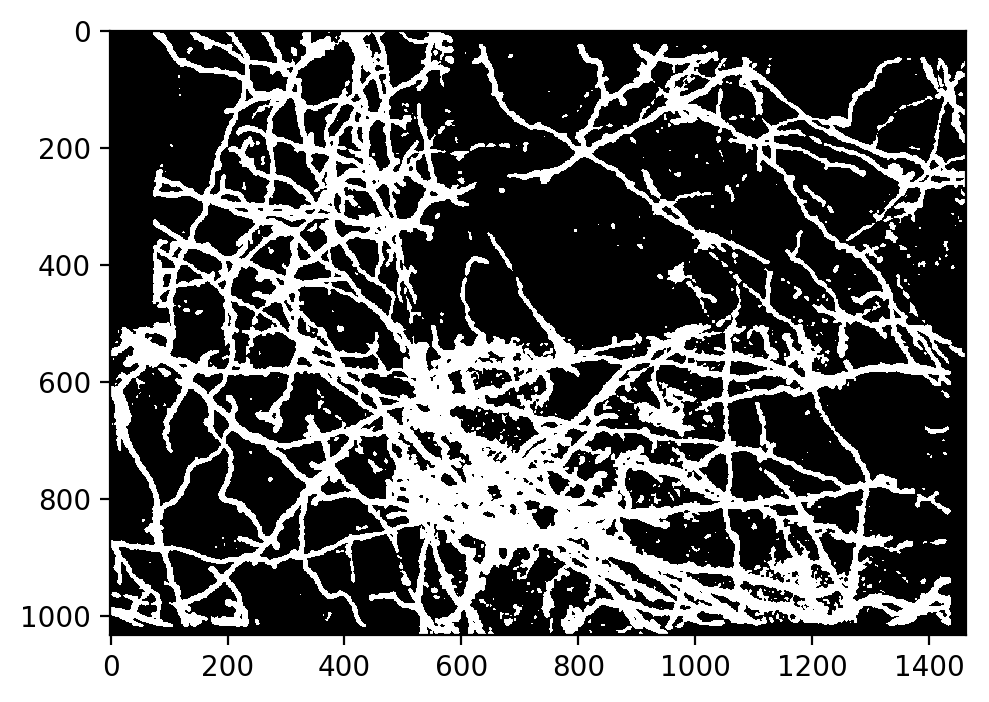

In [262]:
train_x_8, train_y_8, gaussian_msc_arc_X_8, gaussian_msc_arc_Y_8 = Filtered_MSC_Training_Set(8)
classifier_8 = logistic_Regression(gaussian_msc_arc_X_8, gaussian_msc_arc_Y_8)
show_image(image)


Running on hand selected filtered images. semi supervised learning since selecting filters.

({'penalty': 'l2', 'C': 1.0}, 0.6607142857142857)


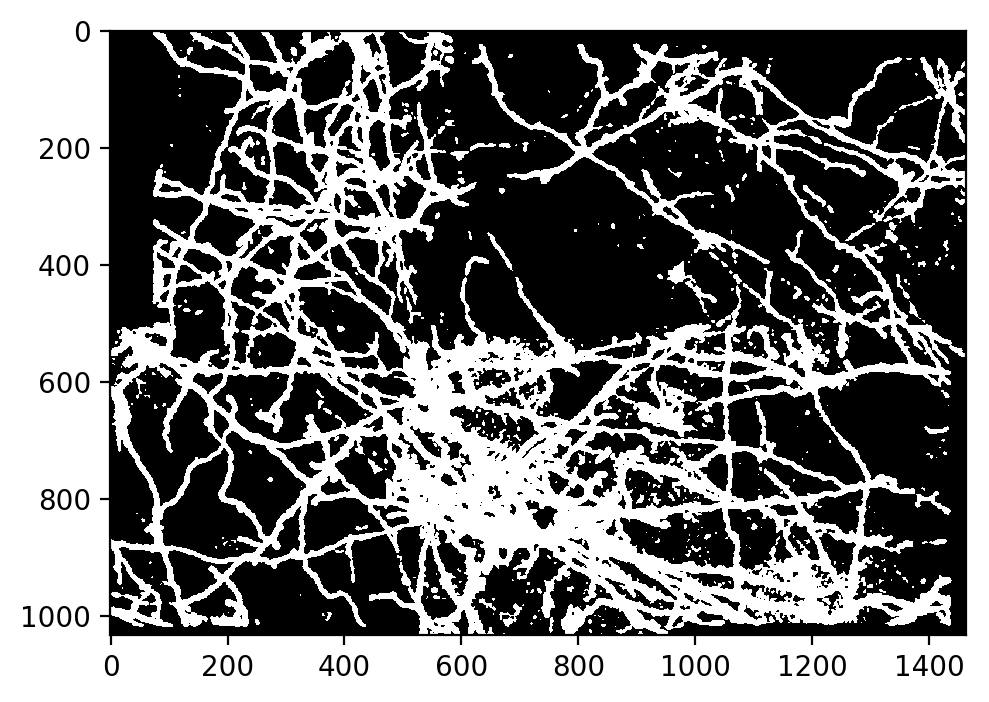

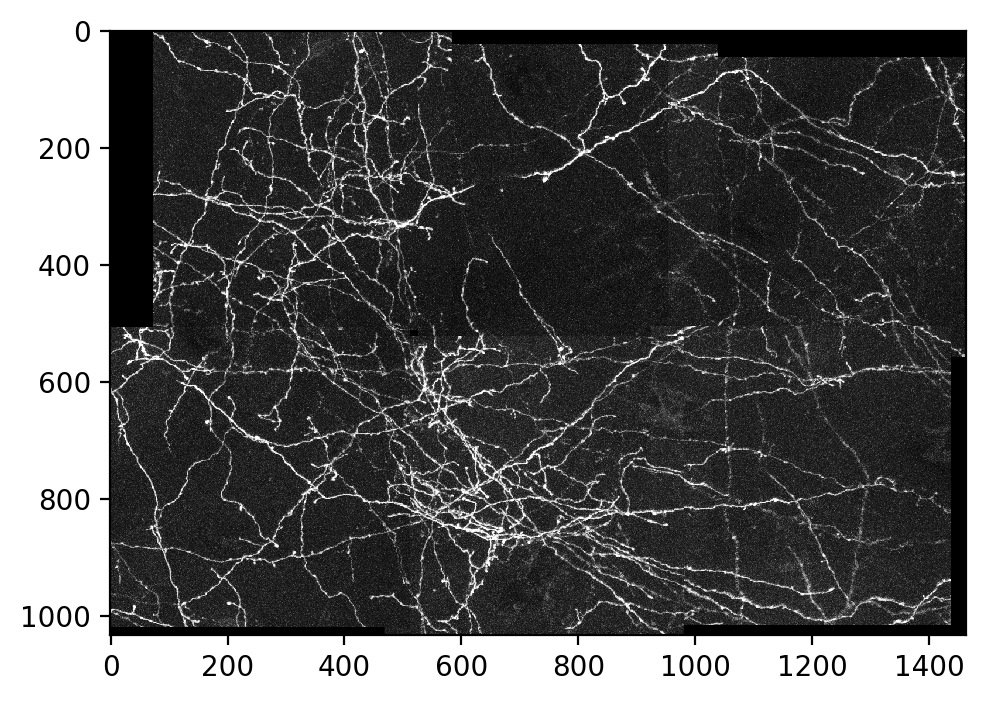

In [282]:
subset_filtered = np.zeros((filtered_images.shape[0],filtered_images.shape[1] ,7))
subset_filtered[:,:,0] = filtered_images[:,:,0]
subset_filtered[:,:,1] = filtered_images[:,:,41]
subset_filtered[:,:,2] = filtered_images[:,:,42]
subset_filtered[:,:,3] = filtered_images[:,:,5]
subset_filtered[:,:,4] = filtered_images[:,:,44]
subset_filtered[:,:,5] = filtered_images[:,:,45]
subset_filtered[:,:,6] = filtered_images[:,:,1]

train_x, train_y, gaussian_msc_arc_X, gaussian_msc_arc_Y = Filtered_MSC_Training_Set(7)
logistic_Regression(gaussian_msc_arc_X, gaussian_msc_arc_Y)
show_image(image)

### option: could we make simple convolutional net with specific filters and only use topological attributes on specifically filtered images?
###  Gaussian mixture model on pixel data of arcs? over more images?

TODO: Look into other linear regression solvers, e.g. ['liblinear', 'lbfgs', 'newton-cg', 'sag', 'saga']:

This was attempt using the pixel values over all arcs then fitting a 
gaussian rather than fitting a gaussian to each arc. Since it does so poorly it suggests smaller arcs may be better. Going to try and filter the MSC with a higher threshold. 

Now using the inflection point of the gaussian fitted to each arc 
as the threshold on filtering the MSC

({'penalty': 'l2', 'C': 1.0}, 0.6666666666666666)


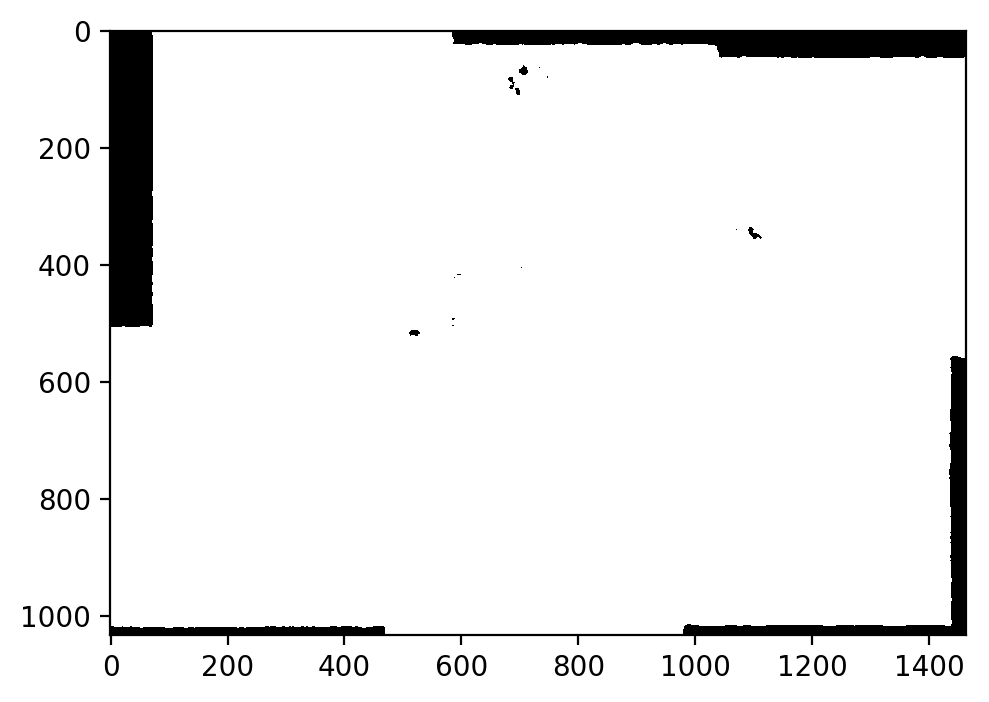

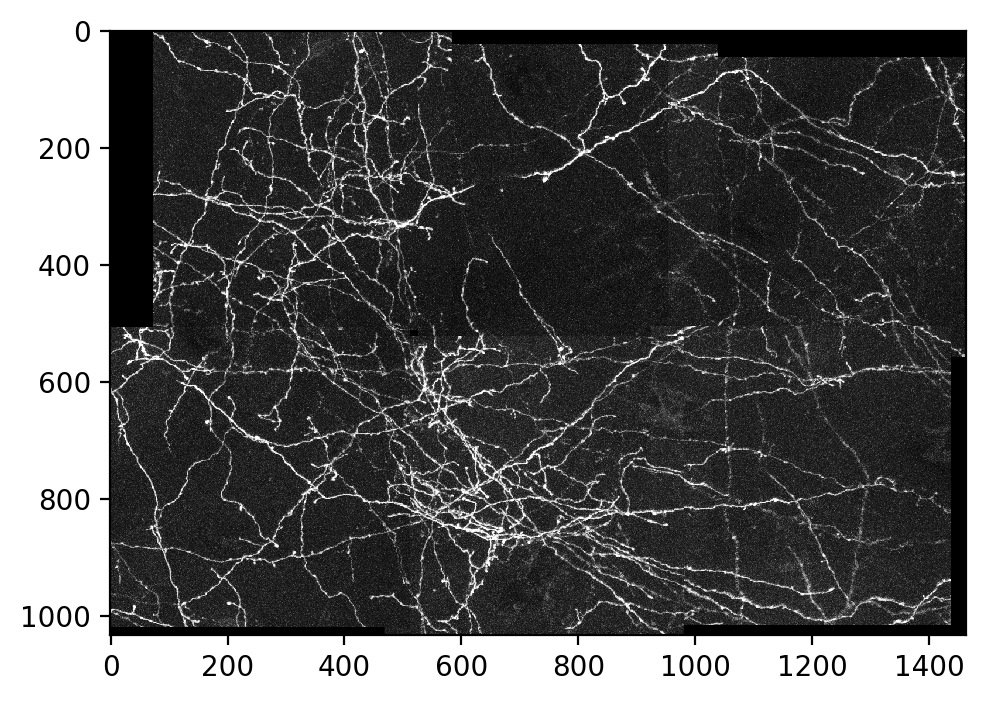

In [321]:
train_x, train_y, gaussian_msc_arc_X, gaussian_msc_arc_Y = Filtered_MSC_Training_Set(1)
logistic_Regression(gaussian_msc_arc_X, gaussian_msc_arc_Y)
show_image(image)

({'penalty': 'l2', 'C': 1.0}, 0.6666666666666666)


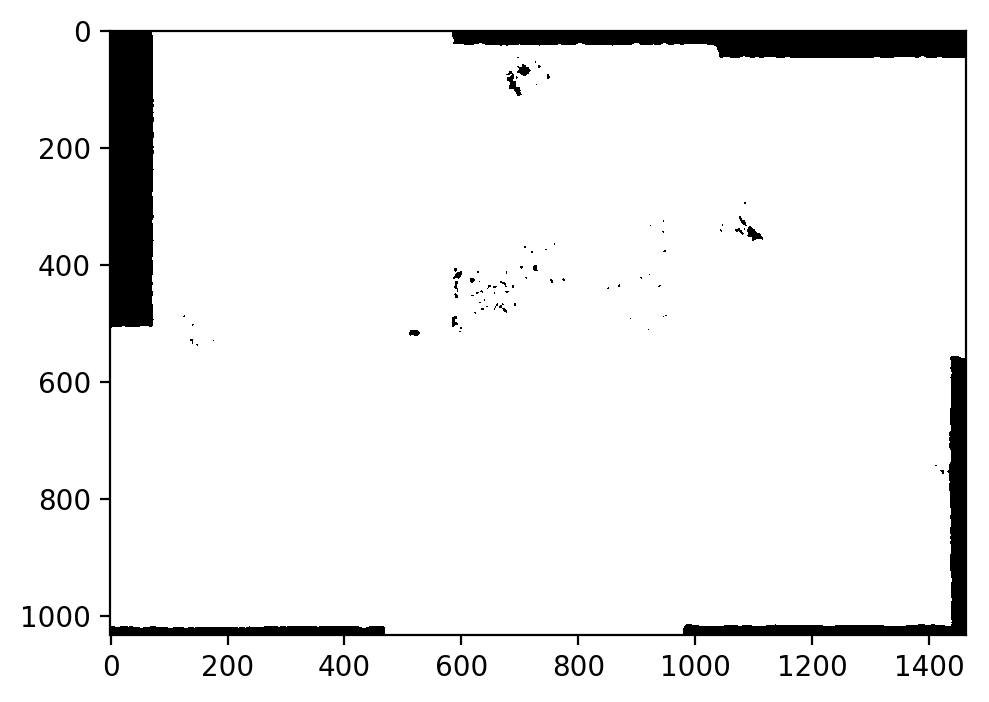

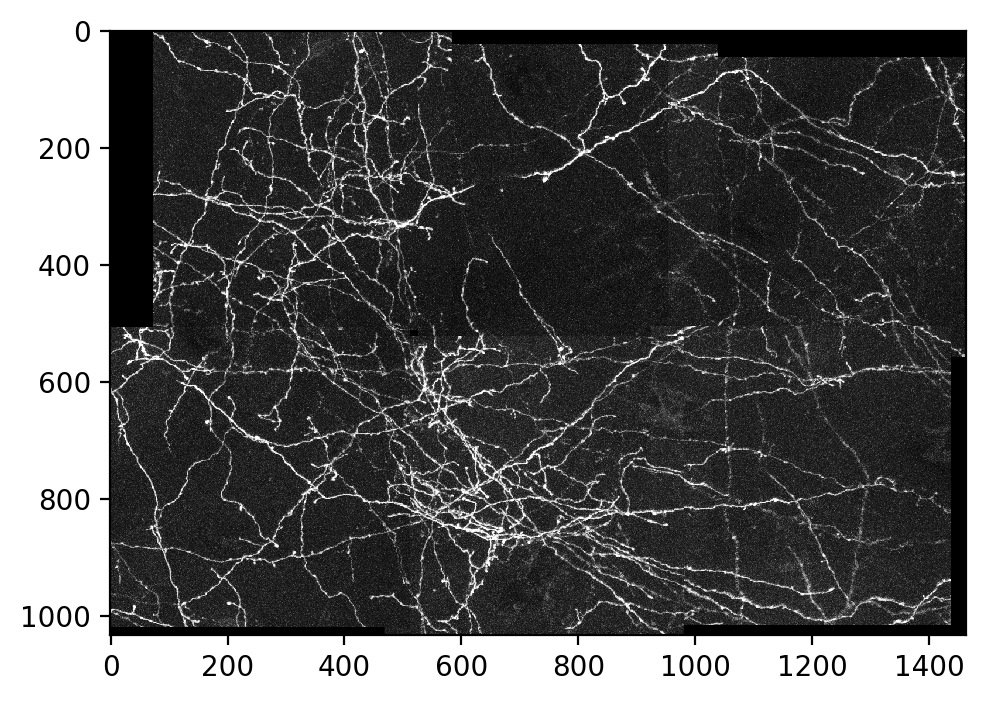

In [322]:
train_x, train_y, gaussian_msc_arc_X, gaussian_msc_arc_Y = Filtered_MSC_Training_Set(1, 35)
logistic_Regression(gaussian_msc_arc_X, gaussian_msc_arc_Y)
show_image(image)

two issues: specificity of edge boarders to capture clustered neurons while preserving 'vague' neurons. e.g. bottom middle square cluster and verticle neuron through right bottom to top. Example above: first of two uses infletion point for filtration and original 8.5 persistence value, second of two uses inflection and persistence of 35.
Below is using mean to filter MSC and persistence of 35

({'penalty': 'l2', 'C': 10}, 0.9359908237666564)


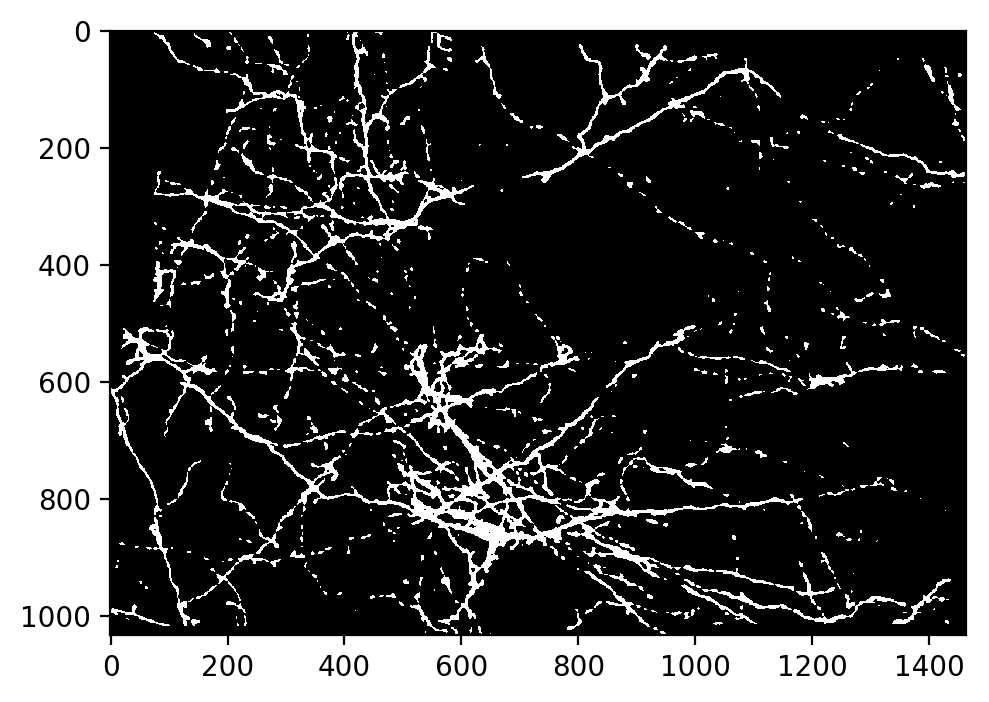

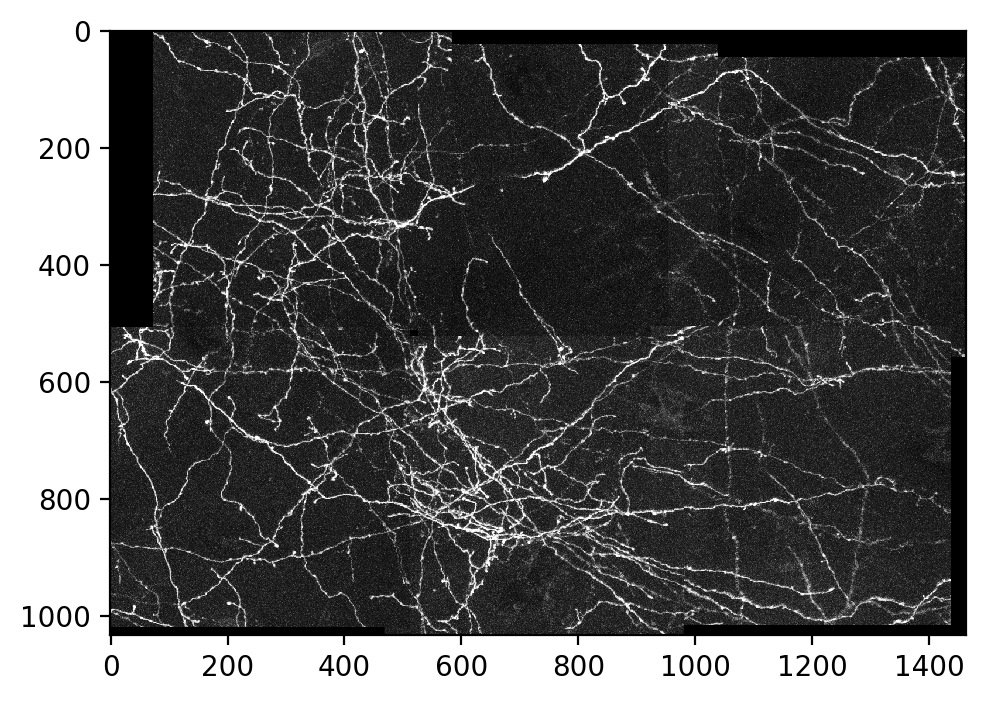

In [308]:
train_x, train_y, g_pos, g_neg = Filtered_MSC_Training_Set(1, 35)
logistic_Regression(gaussian_msc_arc_X, gaussian_msc_arc_Y)
show_image(image)